# South Fork Eel River, CA, ROI#1.2 (south)

## Load *Streamlines* package

In [1]:
import streamlines

## Initiate *Streamlines* workflow

Choose the JSON parameters file we want to work with. The extension `.json` is automatically added.

In [2]:
JSON_parameters_file = 'SouthForkEelRiver2'

Initialize streamline analysis.

In [3]:
sl = streamlines.run( parameters_file=JSON_parameters_file, \
                        do_geodata = False, \
                        do_preprocess = False, \
                        do_condition=True, \
                        do_trace = False, \
                        do_analysis=False, \
                        do_mapping=False, \
                        do_plot=False, \
                        do_display=True, \
                        do_save=False )


Sun 2018-08-12 09:55:12 JST+0900

**Initialization begin**
Loaded JSON parameters file "/Users/colinstark/Work/Streamlines/slm/json/SouthForkEelRiver2.json"
slm git:
[['commit f74a16d68d646db442ad3e1cb3a001212cba02a9',
  'Author: Colin Stark',
  'Date:   Fri Jul 27 20:12:42 2018 +0900',
  '    Mostly implemented FMM measurement of HSL']]
slmnb git:
[['commit ccd1021bece27428fe55ca122aea285a89787f08',
  'Author: Colin Stark',
  'Date:   Tue Jun 26 20:06:54 2018 +0900',
  '    Self sync: Big "bug" fixes: ch mapping, ridges & masking, HSL distbn"']]
slmdata git:
[['commit ebec4d15fce4f5291086f119daf4b4e8f842d9fb',
  'Author: Colin Stark',
  'Date:   Mon May 14 19:27:53 2018 +0900',
  '    Add Ikawa ROI; replace Gabilan DTMs w pit filled']]
**Initialization end**



## Import DTM

In [4]:
sl.geodata.do()


**Geodata begin**
Reading DTM from GeoTIFF file "/Users/colinstark/Work/Streamlines/slmdata/SouthForkEelRiver/SouthForkEelRiver1_res2m_fillsinks0p01_above430m.tif"
(443825.3482, 2.0, 0.0, 4395285.1054, 0.0, -2.0)
DTM size: 3247 x 2368 = 7,688,896 pixels
DTM pixel size: 2.0m
DTM origin:
  - bottom-left pixel center: [443825.35mE, 4390549.11mN]
  - bottom-left pixel corner: [443824.35mE, 4390548.11mN]
ROI pixel bounds:  [[100, 2699], [1100, 2299]]
ROI pixel grid:  2600 x 1200 = 3,120,000 pixels
ROI pixel-edge boundaries (assuming pixel-as-area)
  - in pixel units: [x: 100.0<=>2700.0] , [y: 1100.0<=>2300.0]
  - in meters:      [x: 200.0<=>5400.0] , [y: 2200.0<=>4600.0]
Reading basins from GeoTIFF file "/Users/colinstark/Work/Streamlines/slmdata/SouthForkEelRiver/SouthForkEelRiver1_res2m_fillsinks0p01_above430m_basins.tif"
(443825.3482, 2.0, 0.0, 4395285.1054, 0.0, -2.0)
Mask out all but basin numbers [1168]
**Geodata end**



ERROR 1: NUMPY driver was compiled against GDAL 2.2, but the current library version is 2.4


/Users/colinstark/Work/Streamlines/slm/python/streamlines/plot.py:290: RuntimeWarning: overflow encountered in hypot
  slope = pi/2.0 - arctan(np.hypot(x_grad,y_grad))


Recording figure "roi_shaded_relief"


/opt/local/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/image.py:450: RuntimeWarning: overflow encountered in multiply
  A_resampled *= ((a_max - a_min) / 0.8)


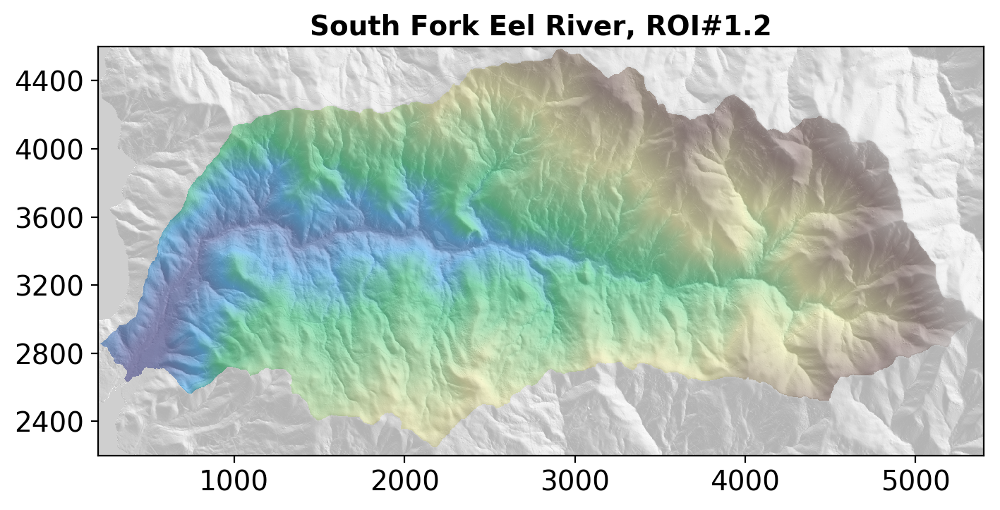

In [5]:
sl.plot.plot_roi_shaded_relief(interp_method='none')

## Preprocess DTM (fix loops etc)

In [6]:
sl.preprocess.do()


**Preprocess begin**
Precondition gradient vector field by fixing loops & blockages
Finding blockages...found 1364...done


/Users/colinstark/Work/Streamlines/slm/python/streamlines/preprocess.py:62: RuntimeWarning: overflow encountered in hypot
  speed_array = np.hypot(u_array,v_array)


Finding and fixing loops...
...done
Fixing blockages...
...done


/Users/colinstark/Work/Streamlines/slm/python/streamlines/preprocess.py:62: RuntimeWarning: overflow encountered in hypot
  speed_array = np.hypot(u_array,v_array)


Mask out bad uv pixels...done
**Preprocess end**



## Trace streamlines

In [7]:
%autosave 0
%time sl.trace.do()
%autosave 120

Autosave disabled

**Trace begin**
Integrating trajectories...
Generating seed points...shuffling...padding for 32 CL work items/group: 1000->1024...done
GPU/OpenCL device global memory limit for streamline trajectories: 3.6GB
GPU/OpenCL device memory required for streamline trajectories: 4MB => no need to chunkify
Total number of kernel instances: 1,024
Number of chunks = seed point array divisor: 1
Chunk size = number of kernel instances per chunk: 1,024
Downstream: downup=0 sgn(uv)=+1.0 chunk=0 seeds: 0+1000 => 1000
Seed point buffer size = 1000.0*8 bytes
0.0% 62.5% 100.0% 
Upstream:   downup=1 sgn(uv)=-1.0 chunk=0 seeds: 0+1000 => 1000
Seed point buffer size = 1000.0*8 bytes
0.0% 62.5% 100.0% 
Building streamlines compressed array
Streamlines actual array allocation:  size=2MB
Computing streamlines statistics
    downstream                            upstream                          
           min         mean          max       min         mean          max
l    90.533524   971.

Autosaving every 120 seconds


In [8]:
import pandas as pd
ddf=pd.DataFrame(sl.trace.traj_stats_df.loc['downstream'].T)
udf=pd.DataFrame(sl.trace.traj_stats_df.loc['upstream'].T)
ddf.style.format("{:.3g}").set_properties(**{'font-size':'140%'})\
    .set_caption('Downstreamline statistics:')
udf.style.format("{:.3g}").set_properties(**{'font-size':'140%'})\
    .set_caption('Upstreamline statistics:')

,min,mean,max
l,90.5,971,1e+03
n,140,1.48e+03,1.52e+03
ds,0.647,0.658,0.661


,min,mean,max
l,2.47,640,1e+03
n,2,1.05e+03,2e+03
ds,0.0569,0.634,1.24


Autosave disabled
Plotting all 1,000 down streamlines
Progress: 1%...2%...3%...4%...5%...6%...7%...8%...9%...10%...11%...12%...13%...14%...15%...16%...17%...18%...19%...20%...21%...22%...23%...24%...25%...26%...27%...28%...29%...30%...31%...32%...33%...34%...35%...36%...37%...38%...39%...40%...41%...42%...43%...44%...45%...46%...47%...48%...49%...50%...51%...52%...53%...54%...55%...56%...57%...58%...59%...60%...61%...62%...63%...64%...65%...66%...67%...68%...69%...70%...71%...72%...73%...74%...75%...76%...77%...78%...79%...80%...81%...82%...83%...84%...85%...86%...87%...88%...89%...90%...91%...92%...93%...94%...95%...96%...97%...98%...99%...100%
Plotting all 1,000 up streamlines
Progress: 1%...2%...3%...4%...5%...6%...7%...8%...9%...10%...11%...12%...13%...14%...15%...16%...17%...18%...19%...20%...21%...22%...23%...24%...25%...26%...27%...28%...29%...30%...31%...32%...33%...34%...35%...36%...37%...38%...39%...40%...41%...42%...43%...44%...45%...46%...47%...48%...49%...50%...51%...52%..

Autosaving every 120 seconds


/opt/local/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/image.py:450: RuntimeWarning: overflow encountered in multiply
  A_resampled *= ((a_max - a_min) / 0.8)


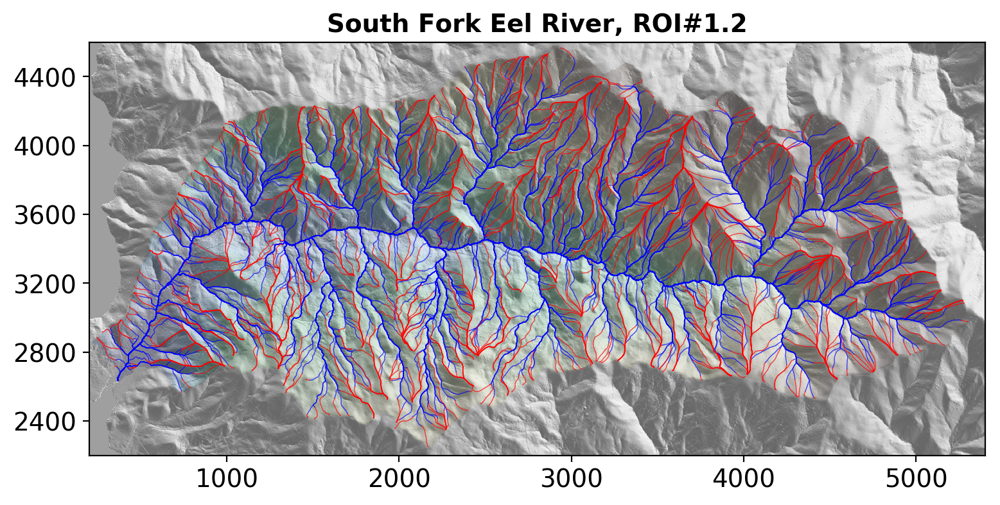

In [9]:
%autosave 0
sl.plot.plot_streamlines(window_size_factor=3)
%autosave 120

## Viz streamline flow concentrations

In [10]:
# sl.plot.plot_flow_maps(window_size_factor=3)

## Analyze streamline distributions

In [11]:
# sl.analysis.do()

In [12]:
# sl.plot.plot_distributions()

## Map channels, segments & hillslope lengths

In [13]:
sl.mapping.pass1()


**Pass#1 begin**
Channels...done
Connecting channel pixels...
...done
Thinning channels...skeletonizing...done
Mapping channel heads...
...done
Counting down channels...
...done
Flagging down channels...
...done
Labeling confluences...
...done
Flagging down channels...
...done
Flagging down channels...
...done
Flagging down channels...
...done
Segmenting channels...number of segments=107
...done
Linking hillslopes...
...done
Segmenting hillslopes...
...done
Subsegmenting left & right flanks...number of subsegments=215
...done
Prepare for mapping HSL from midslopes
Midslopes...done
Ridges...done
**Pass#1 end**


In [14]:
sl.mapping.pass2()


**Pass#2 begin**
0.0% -107 
Channel threshold = 131.6m
FMM mean HSL   = 82.9m
Trace mean HSL = 106.4m
0.5% -106 
Channel threshold = 104.7m
FMM mean HSL   = 59.4m
Trace mean HSL = 76.4m
0.9% -105 
Channel threshold = 61.6m
FMM mean HSL   = 60.3m
Trace mean HSL = 81.6m
1.4% -104 
Channel threshold = 66.7m
FMM mean HSL   = 59.7m
Trace mean HSL = 68.2m
1.9% -103 
Channel threshold = 116.6m
FMM mean HSL   = 93.4m
Trace mean HSL = 101.7m
2.3% -102 
Channel threshold = 91.8m
FMM mean HSL   = 73.9m
Trace mean HSL = 95.5m
2.8% -101 
Channel threshold = 102.5m
FMM mean HSL   = 72.6m
Trace mean HSL = 86.1m
3.3% -100 
Channel threshold = 82.9m
FMM mean HSL   = 81.8m
Trace mean HSL = 100.6m
3.7% -99 
Channel threshold = 74.5m
FMM mean HSL   = 61.5m
Trace mean HSL = 77.5m
4.2% -98 
Channel threshold = 103.2m
FMM mean HSL   = 65.8m
Trace mean HSL = 84.4m
4.7% -97 
Channel threshold = 104.5m
FMM mean HSL   = 70.7m
Trace mean HSL = 86.5m
5.1% -96 
Channel threshold = 286.3m
FMM mean HSL   = 99.2m
Tra

45.8% -9 
Channel threshold = 123.4m
FMM mean HSL   = 51.5m
Trace mean HSL = 82.9m
46.3% -8 
Channel threshold = 57.2m
FMM mean HSL   = 47.1m
Trace mean HSL = 62.8m
46.7% -7 
Channel threshold = 73.4m
FMM mean HSL   = 50.8m
Trace mean HSL = 86.8m
47.2% -6 
Channel threshold = 118.8m
FMM mean HSL   = 40.9m
Trace mean HSL = 69.4m
47.7% -5 
Channel threshold = 158.0m
FMM mean HSL   = 55.9m
Trace mean HSL = 81.3m
48.1% -4 
Channel threshold = 107.4m
FMM mean HSL   = 67.0m
Trace mean HSL = 79.1m
48.6% -3 
Channel threshold = 114.9m
FMM mean HSL   = 64.8m
Trace mean HSL = 78.7m
49.1% -2 
Channel threshold = 104.6m
FMM mean HSL   = 27.7m
Trace mean HSL = 43.2m
49.5% -1 
Channel threshold = 150.0m
FMM mean HSL   = 30.2m
Trace mean HSL = 38.7m
50.0% +1 
Channel threshold = 66.0m
FMM mean HSL   = 42.8m
Trace mean HSL = 57.2m
50.5% +2 
Channel threshold = 69.1m
FMM mean HSL   = 45.1m
Trace mean HSL = 63.7m
50.9% +3 
Channel threshold = 95.8m
FMM mean HSL   = 46.9m
Trace mean HSL = 72.7m
51.4% +4 

FMM mean HSL   = 104.8m
Trace mean HSL = 150.8m
92.1% +91 
Channel threshold = 79.7m
FMM mean HSL   = 57.5m
Trace mean HSL = 78.0m
92.5% +92 
Channel threshold = 150.0m
FMM mean HSL   = 22.0m
Trace mean HSL = 25.6m
93.0% +93 
Channel threshold = 135.2m
FMM mean HSL   = 69.8m
Trace mean HSL = 87.9m
93.5% +94 
Channel threshold = 185.5m
FMM mean HSL   = 25.0m
Trace mean HSL = 26.8m
93.9% +95 
Channel threshold = 171.4m
FMM mean HSL   = 78.3m
Trace mean HSL = 110.6m
94.4% +96 
Channel threshold = 247.7m
FMM mean HSL   = 104.7m
Trace mean HSL = 154.3m
94.9% +97 
Channel threshold = 153.0m
FMM mean HSL   = 71.2m
Trace mean HSL = 106.8m
95.3% +98 
Channel threshold = 182.3m
FMM mean HSL   = 84.1m
Trace mean HSL = 110.3m
95.8% +99 
Channel threshold = 198.5m
FMM mean HSL   = 15.0m
Trace mean HSL = 15.0m
96.3% +100 
Channel threshold = 118.0m
FMM mean HSL   = 29.0m
Trace mean HSL = 37.4m
96.7% +101 
Channel threshold = 161.0m
FMM mean HSL   = 48.1m
Trace mean HSL = 58.5m
97.2% +102 
Channel th

In [15]:
sl.mapping.pass3()


**Pass#3 begin**
Connecting channel pixels...
...done
Thinning channels...skeletonizing...done
Mapping channel heads...
...done
Counting down channels...
...done
Flagging down channels...
...done
Mapping hillslope lengths from midslopes...dilation with 51m (25-pixel) width filter...mean filtering with 60m (30-pixel) diameter disk...done
Computing hillslope aspect with median filter radii 4m (slope), 50m (uv)...

/Users/colinstark/Work/Streamlines/slm/python/streamlines/mapping.py:837: RuntimeWarning: overflow encountered in true_divide
  uvx_array = sf*median(np.uint8((uv_array[:,:,0]+1.0)/sf),median_disk)-1.0
/Users/colinstark/Work/Streamlines/slm/python/streamlines/mapping.py:838: RuntimeWarning: overflow encountered in true_divide
  uvy_array = sf*median(np.uint8((uv_array[:,:,1]+1.0)/sf),median_disk)-1.0


done
Computing hillslope length-aspect function...done
Computing hillslope length-aspect statistics...done
**Pass#3 end**


## Viz channels & segments

Recording figure "channels"
Recording figure "label"


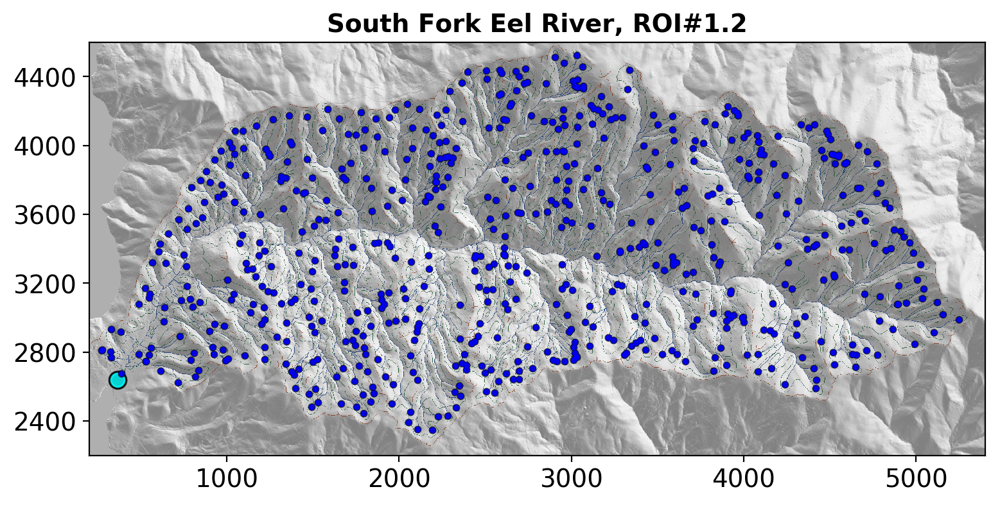

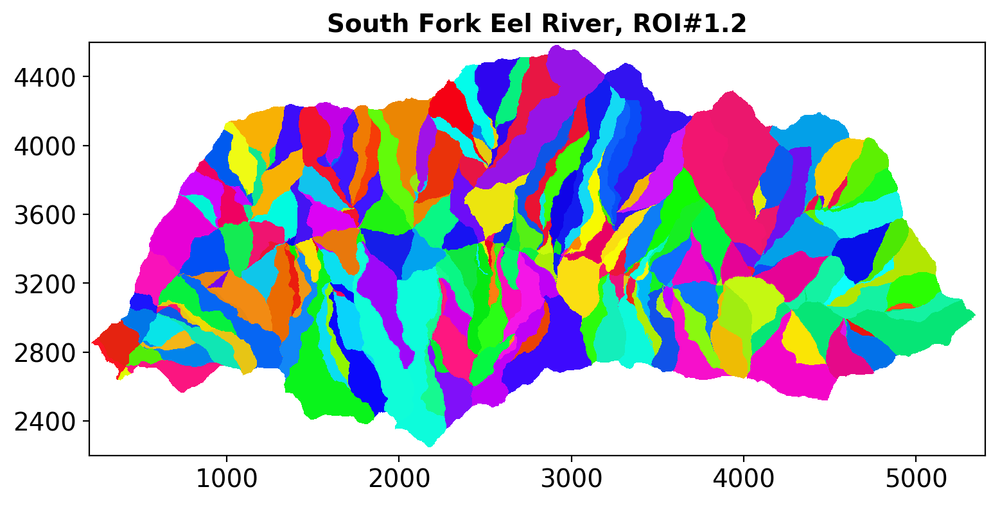

In [16]:
sl.plot.plot_channels(window_size_factor=3)
sl.plot.plot_segments(window_size_factor=3)

## Viz hillslope lengths

In [17]:
pctile=0.5
sl.plot.hsl_z_min=pctile
sl.plot.hsl_z_pctile=100-pctile
sl.plot.contour_hsl_z_min=pctile
sl.plot.contour_hsl_z_pctile=100-pctile

Recording figure "hsl"


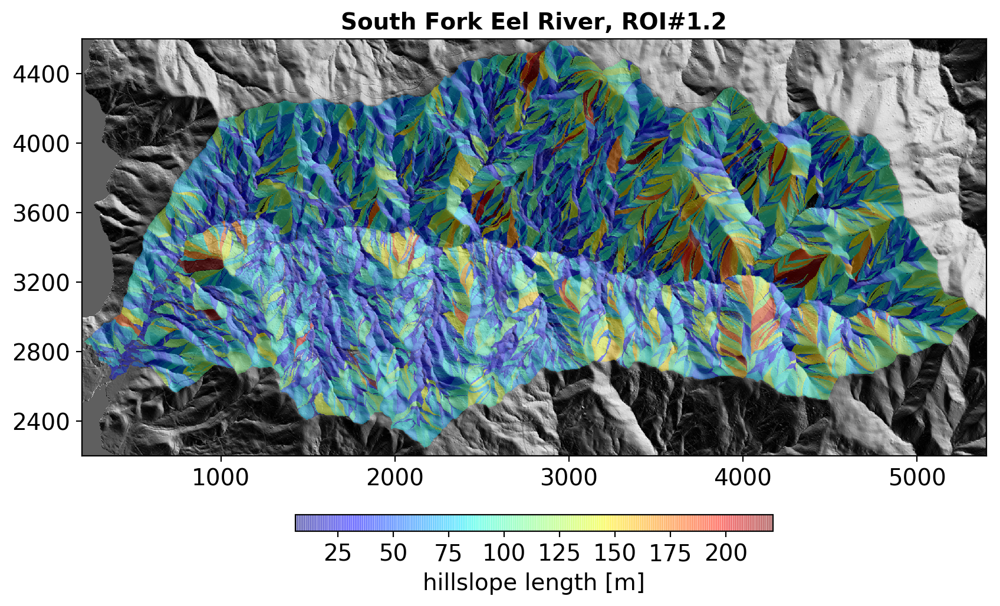

In [18]:
sl.plot.plot_hsl(window_size_factor=3.3)

Recording figure "hsl_contours"


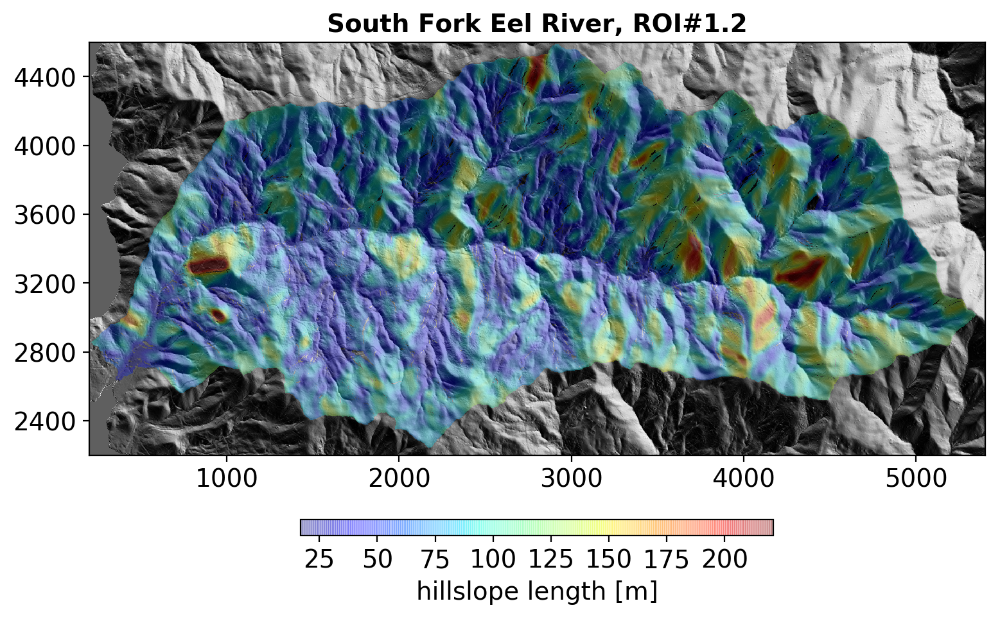

In [19]:
sl.plot.plot_hsl_contoured(window_size_factor=3)

## Viz aspect, hillslope length

Recording figure "aspect"


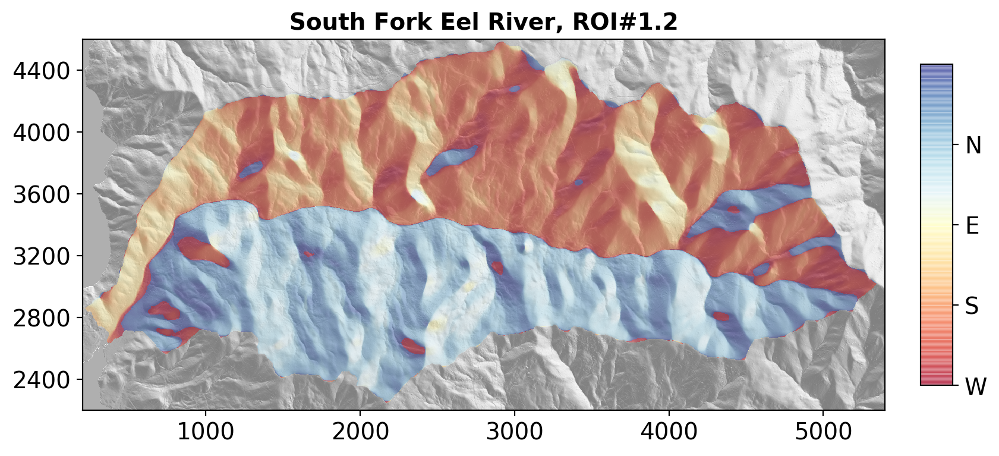

In [20]:
sl.plot.plot_aspect(window_size_factor=3.15)

In [21]:
sl.mapping.check_hsl_ns_disparity()

HSL mean ± σ(split), σ(all):	      83.4m ± 4.6m (split) 6.7m (all)
HSL N-S disparity:		      82.6mN vs 84.7mS   ∆≈2.1m
HSL N-S rel disparity vs variation:   2.5% (2.1m) NS vs 5.5% (4.6m)
HSL N-S disparity signal-noise ratio: ∆/σ = 0.5
					=> very weak south bias
N-facing vs S-facing HSL distribution comparison tests
  for f(HSL_N,S) with N,S bounds 45°<|±aspect|<135° from east
D_alpha =  c(alpha)*0.00754081
Kolmogorov-Smirnov: 0.14 p=6.43876e-281
Mann-Whitney:       0.43 p=4.89259e-226
Rank-sum:           -32.1 p=9.78513e-226
Student's t:        -36.8 p=4.02215e-294
Welch:              -37.4 p=8.81412e-304
P-P:                -8%


Recording figure "hsl_aspect_distribution"


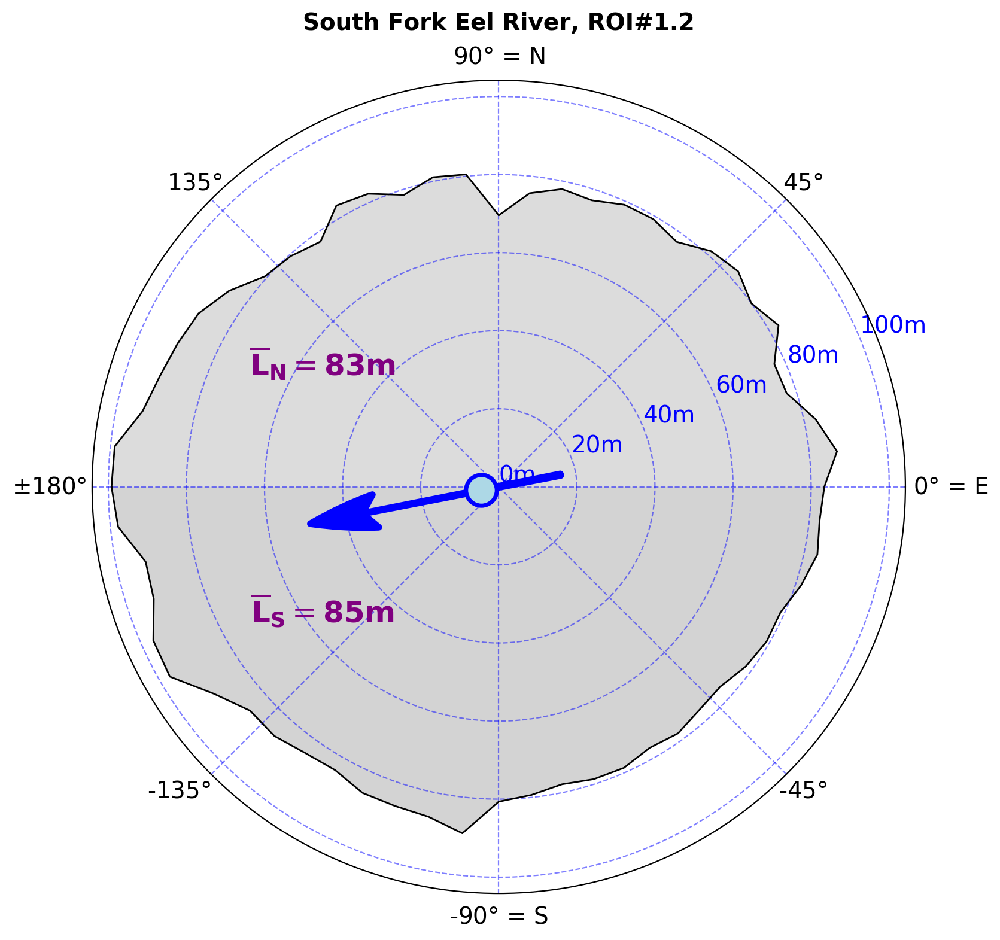

In [22]:
sl.plot.plot_hsl_aspect_distribution(window_size_factor=3)

## Hillslope length stats

Plotting hillslope length distributions...
Recording figure "hsl_nsall_distbn"
Recording figure "hsl_ns_qq"
Recording figure "hsl_ns_pp"


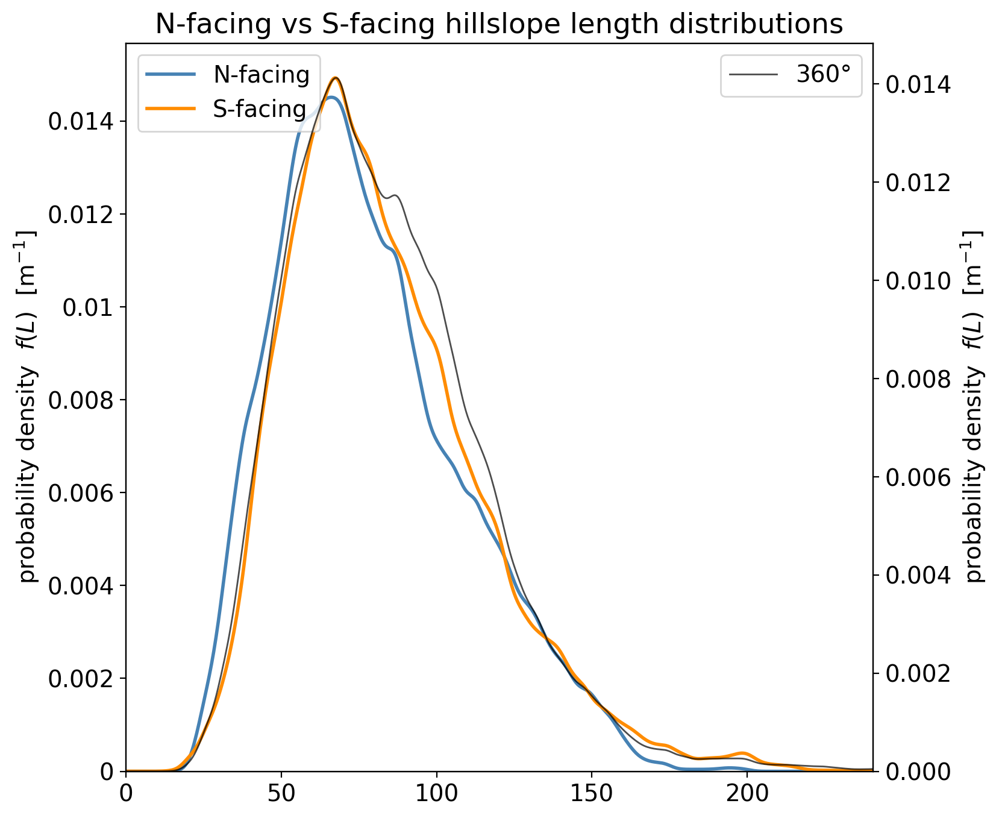

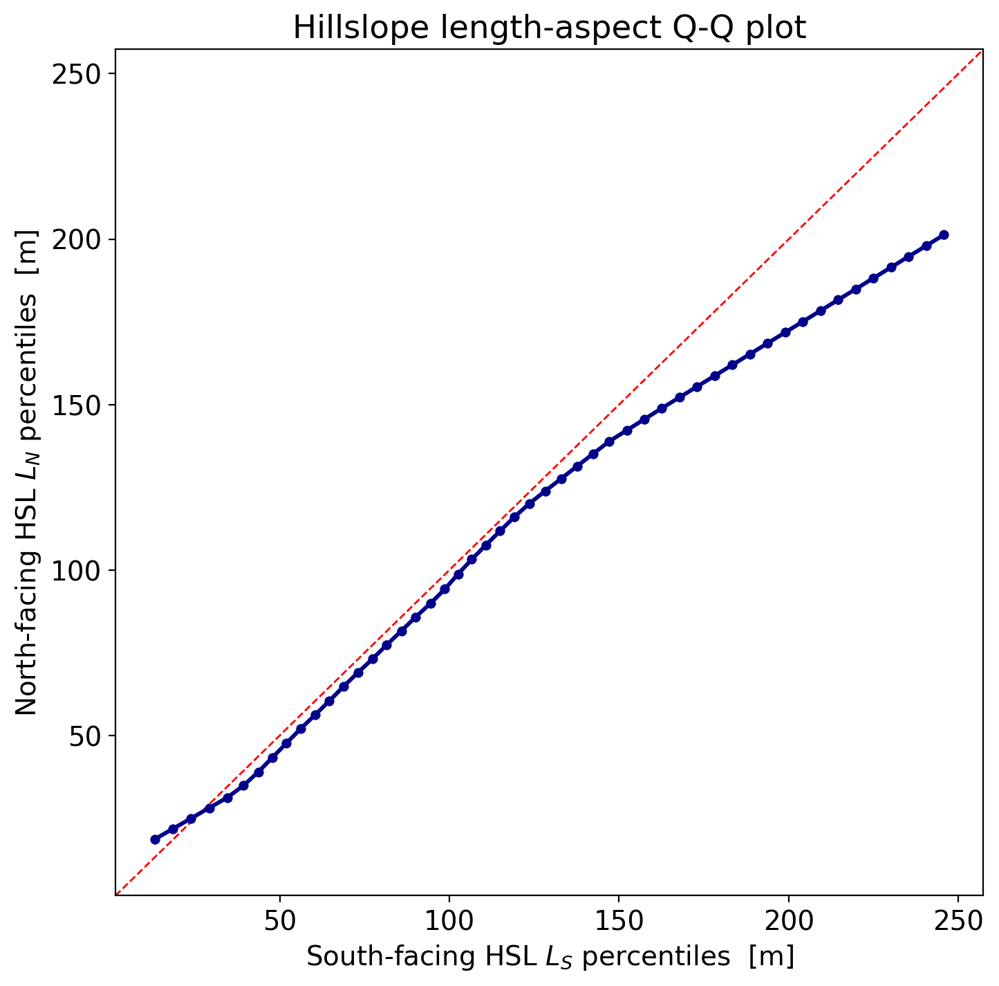

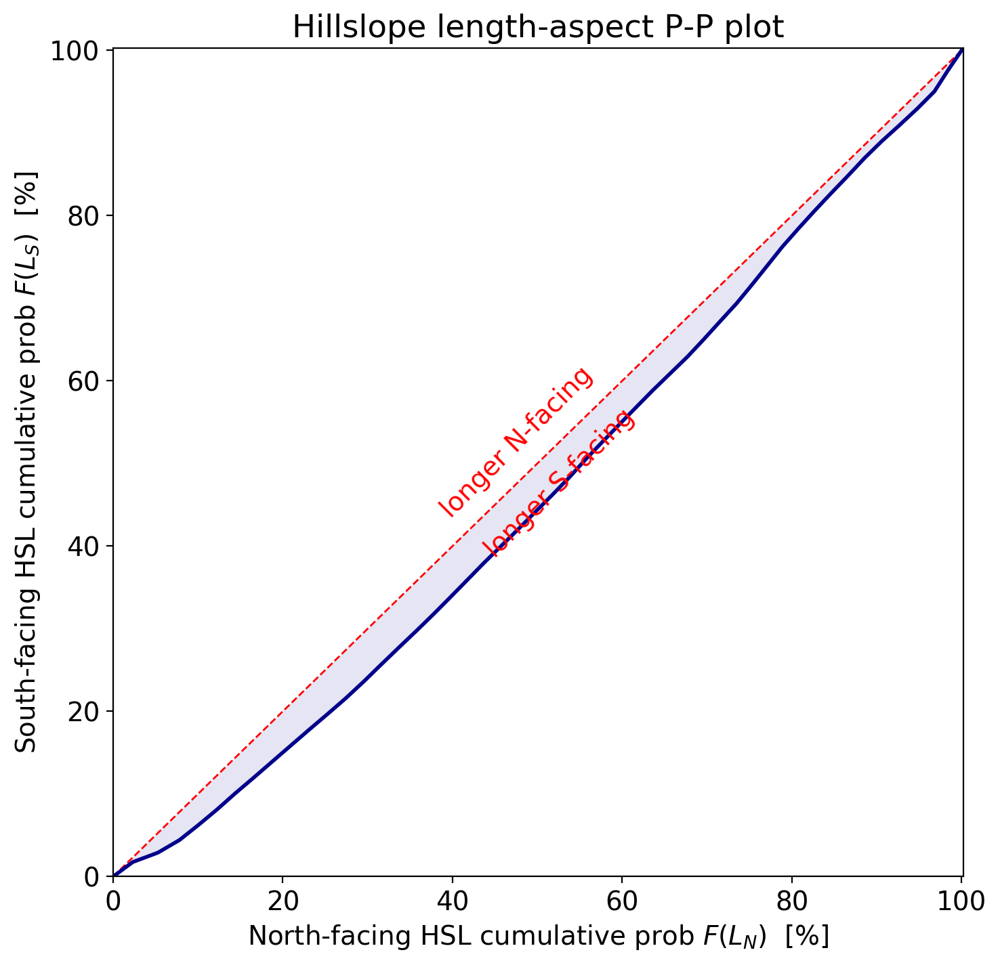

In [23]:
sl.plot.mhsl_pdf_x_stretch=0.9
sl.plot.plot_hsl_distributions()

In [24]:
df = sl.mapping.hsl_stats_df
df[:30].style.format("{:.3g}").set_properties(**{'font-size':'140%'}) \
         .set_caption('Hillslope length statistics:')
df.mean()

,,count,mean [m],stddev [m]
fine,coarse,,,


count        NaN
mean [m]     NaN
stddev [m]   NaN
dtype: float64

## Export plots

In [25]:
sl.plot.figs

{'roi_shaded_relief': <Figure size 810x810 with 1 Axes>,
 'streamlines': <Figure size 900x900 with 1 Axes>,
 'channels': <Figure size 900x900 with 1 Axes>,
 'label': <Figure size 900x900 with 1 Axes>,
 'hsl': <Figure size 990x990 with 2 Axes>,
 'hsl_contours': <Figure size 900x900 with 2 Axes>,
 'aspect': <Figure size 945x945 with 2 Axes>,
 'hsl_aspect_distribution': <Figure size 900x900 with 1 Axes>,
 'hsl_nsall_distbn': <Figure size 800x800 with 2 Axes>,
 'hsl_ns_qq': <Figure size 810x810 with 1 Axes>,
 'hsl_ns_pp': <Figure size 810x810 with 1 Axes>}

In [26]:
sl.save.do()


**Write results to files begin**
Saving maps...
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_dtm_mask.tif (2604, 1204)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_basin_mask.tif (2604, 1204)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_uv.tif (2604, 1204, 2)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_slope.tif (2604, 1204)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_mapping.tif (2604, 1204)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_coarse_subsegment.tif (2604, 1204)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_merged_coarse_mask.tif (2604, 1204)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_hsl.tif (2604, 1204)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_hsl_smoothed.t

/opt/local/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/image.py:450: RuntimeWarning: overflow encountered in multiply
  A_resampled *= ((a_max - a_min) / 0.8)


('streamlines', <Figure size 900x900 with 1 Axes>)
Writing <streamlines> to "/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_streamlines.pdf"
('channels', <Figure size 900x900 with 1 Axes>)
Writing <channels> to "/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_channels.pdf"
('label', <Figure size 900x900 with 1 Axes>)
Writing <label> to "/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_label.pdf"
('hsl', <Figure size 990x990 with 2 Axes>)
Writing <hsl> to "/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_hsl.pdf"
('hsl_contours', <Figure size 900x900 with 2 Axes>)
Writing <hsl_contours> to "/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_hsl_contours.pdf"
('aspect', <Figure size 945x945 with 2 Axes>)
Writing <aspect> to "/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver2/SouthForkEelRiver2_aspect.pdf"
('hsl_aspect_distri